In [2]:
import os
import glob
import seaborn as sns
import pandas as pd
import numpy as np
import itertools
import matplotlib.pyplot as plt
import timecorr as tc
import matplotlib.pyplot as plt
%matplotlib inline

In [3]:
import networkx as nx
import matplotlib.colors as mcolors
from scipy.io import loadmat
from timecorr.helpers import isfc, wisfc, mean_combine, corrmean_combine, reduce
import itertools
import hypertools as hyp
import imageio

In [4]:
def get_chars_from_df(out_df):   
    """
    Function to clean up unique list of characters, will be redundant after
    the feature extraction notebook is updated
    
    Parameters
    ----------
    out_df: output csv for each script with segmented events as rows
    
    Returns
    -------
    characters: 2d list of unique characters in each event
    """
    characters = []
    for row in range(out_df.shape[0]):
    
        character_per_event = eval(out_df.loc[row, 'characters'])
        vals = {key: character_per_event[key] for key in character_per_event}
        characters.append(vals)
    return characters

In [5]:
def event_by_char_all_events(out_df):
    char_event_dict = get_chars_from_df(out_df)
    row_length = out_df.shape[0]
    c = [list(val.keys()) for val in char_event_dict]
    chars = list(dict.fromkeys(sum(c,[])))
    col_length = len(chars)
    print('We have {0} events and {1} characters'.format(row_length, col_length))
    row_names = ['Event {0}'.format(n) for n in np.arange(row_length)]
    col_names = chars
    df = pd.DataFrame(np.zeros((row_length, col_length)), columns=col_names, index=row_names)
    
    for event_num in range(row_length):
        for char_k, val in char_event_dict[event_num].items():
            row_label = 'Event {}'.format(event_num)
            df.loc[row_label, char_k] += val
    return df

In [6]:
def get_dynamic_correlations(out_df):

    df = event_by_char_all_events(out_df)

    mention_matrix = df.values
    print('Original matrix has dimensions'.format(mention_matrix.shape))

    # specify kernel
    width = 3
    gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}
    vec_corrs = tc.timecorr(mention_matrix, weights_function=gaussian['weights'], weights_params=gaussian['params'])

    print('vectorized shape : ' + str(np.shape(vec_corrs)))

    # use the vec2mat function to convert vectorized correlations to moment-by-moment full correlations
    mat_corrs = tc.vec2mat(vec_corrs)

    print('matrix shape : ' + str(np.shape(mat_corrs)))
    
    return mat_corrs

In [7]:
def get_dynamic_correlations_raw(out_df):

    df = event_by_char_all_events(out_df)

    mention_matrix = df.values
    print('Original matrix has dimensions'.format(mention_matrix.shape))

    # specify kernel
    width = 3
    delta = {'name': '$\delta$', 'weights': tc.eye_weights, 'params': tc.eye_params}
    vec_corrs = tc.timecorr(mention_matrix, weights_function=delta['weights'], weights_params=delta['params'])

    print('vectorized shape : ' + str(np.shape(vec_corrs)))

    # use the vec2mat function to convert vectorized correlations to moment-by-moment full correlations
    mat_corrs = tc.vec2mat(vec_corrs)

    print('matrix shape : ' + str(np.shape(mat_corrs)))
    
    return mat_corrs

In [33]:
def get_dynamic_correlations_raw_second(mat):

 

    mention_matrix = mat
    print(mention_matrix.shape)

    # specify kernel
    width = 3
    delta = {'name': '$\delta$', 'weights': tc.eye_weights, 'params': tc.eye_params}
    vec_corrs = tc.timecorr(mention_matrix, weights_function=delta['weights'], weights_params=delta['params'])

    print('vectorized shape : ' + str(np.shape(vec_corrs)))

    # use the vec2mat function to convert vectorized correlations to moment-by-moment full correlations
    mat_corrs = tc.vec2mat(vec_corrs)

    print('matrix shape : ' + str(np.shape(mat_corrs)))
    
    return mat_corrs

In [8]:
def recurring_chars(df, more_than=0.1):
    char_mat = event_by_char_all_events(df)
    threshold = more_than*np.max(char_mat.sum())
    above_thresh = char_mat[char_mat.columns[char_mat.sum()>threshold]]
    #characters_above_thresh = above_thresh.columns
    #return list(characters_above_thresh)
    return above_thresh

In [60]:
def draw(G, pos, measures, measure_name, hubs=None, outfile=None, vmin=-1, vmax=1, weight=None):
    fig, ax = plt.subplots(figsize=(20, 10))
    
    if hubs:
        labels = {}    
        for node in G.nodes():
            if node in hubs:
                #set the node name as the key and the label as its value 
                labels[node] = node
    
        nodes = nx.draw_networkx_nodes(G, pos, node_size=500, with_labels=False, cmap=plt.cm.plasma, 
                                   node_color=list(measures.values()),
                                   nodelist=measures.keys(), font_size=15, vmin=-1, vmax=1, center=0)
        
        nx.draw_networkx_labels(G,pos,labels,font_size=20,bbox=dict(facecolor='white', alpha=0.7), font_color='k')
    
    else:
        
        nodes = nx.draw_networkx_nodes(G, pos, node_size=500, with_labels=True, cmap=plt.cm.plasma, 
                                       node_color=list(measures.values()),
                                       nodelist=measures.keys(), alpha=.25, font_size=15, vmin=-1, vmax=1, center=0)
        labels = nx.draw_networkx_labels(G, pos)
    
    nodes.set_norm(mcolors.SymLogNorm(linthresh=0.01, linscale=1, vmin=vmin, vmax=vmax))
    
    edges = nx.draw_networkx_edges(G, pos)

    plt.title(measure_name)
    plt.colorbar(nodes)
    #cbar = fig.colorbar(nodes, ticks=[-1, 0, 1])
    #cbar.ax.set_yticklabels(['< -1', '0', '> 1']) 
    plt.axis('off')
    if outfile:
        plt.savefig(outfile)
    #plt.close()

In [73]:
def plot_network_corrs(dynamic_corrs, labels, hubs, filter_links=.2, gif_file=None, title=None, network_measure='eigenvector_centrality'):
    
    time_len = dynamic_corrs.shape[2]
    feature_len = dynamic_corrs.shape[0]
    assert(len(labels)==feature_len)
    
    # Create dataframe of the last even character's correlations
    corr = pd.DataFrame(dynamic_corrs[:, :, time_len-1])
    corr.columns = labels
    corr.index = labels
    
    # Transform it in a links data frame (3 columns only):
    links = corr.stack().reset_index()
    links.columns = ['var1', 'var2','value']
    links
    
    # Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
    links_filtered=links.loc[ (abs(links['value']) > filter_links) & (links['var1'] != links['var2']) ]

    links_filtered

    # Build your graph
    G=nx.from_pandas_edgelist(links_filtered, 'var1', 'var2')

    pos = nx.spring_layout(G)
    cmap_min = min(nx.eigenvector_centrality(G).values())
    cmap_max = max(nx.eigenvector_centrality(G).values())
    
    
    for x in np.arange(0, time_len-1, 1):


        corr = pd.DataFrame(dynamic_corrs[:, :, x])
        corr.columns = labels
        corr.index = labels

        # Transform it in a links data frame (3 columns only):
        links = corr.stack().reset_index()
        links.columns = ['var1', 'var2','value']
        links

        # Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
        links_filtered=links.loc[ (abs(links['value']) > filter_links) & (links['var1'] != links['var2']) ]

        links_filtered

        # Build your graph
        G=nx.from_pandas_edgelist(links_filtered, 'var1', 'var2')

        #outfile = os.path.join(gif_path, str(x).zfill(6) + '.png')
        outfile = os.path.join(gif_file, str(x).zfill(6) + '.png')
        # for eigenvector centrality 
        if title:
            draw(G, pos, nx.eigenvector_centrality(G), title, hubs=hubs, outfile=outfile, vmin=cmap_min, vmax=cmap_max)
        else:
            draw(G, pos, nx.eigenvector_centrality(G), 'Eigenvector centrality', hubs=hubs, outfile=outfile, vmin=cmap_min, vmax=cmap_max)

        plt.show()
        plt.clf()
        plt.close()
    
    name='eig_gif'
    images = []
    
    for file in os.listdir(gif_file):
        if file.endswith(".png"):
            images.append(imageio.imread(os.path.join(gif_file, file)))


    gif_outfile = os.path.join(gif_file, name + '.gif')  
    duration = 0.15
    imageio.mimwrite(gif_outfile, images, duration=duration)

Loading the wanted files

In [11]:
fig_dir = '../../figures/'
root_dir = '../../data/movie_data/'
fns = glob.glob(os.path.join(root_dir,'*.csv'))

In [12]:
titles = ['10 Things I Hate About You', 'Lord of the Rings: Fellowship of the Ring, The', 'Forrest Gump', 'Star Wars: The Phantom Menace']
title_fn = []
for title in titles:
    title_str = '_'.join(title.lower().split(' '))
    title_fn.append(os.path.join(root_dir, '{}.csv'.format(title_str)))

In [65]:
def generate_network_plots(fn, fig_dir, threshold):
    movie_title = fn.split('/')[-1].split('.')[0]
    out_df = pd.read_csv(fn)
    movie_fig_path = os.path.join(fig_dir, movie_title)
    if not os.path.exists(movie_fig_path):
        os.mkdir(movie_fig_path)
    #dyna_mat = get_dynamic_correlations_raw(out_df)
    dyna_mat = get_dynamic_correlations(out_df)
    #raw_dyna_mat = get_dynamic_correlations_raw(out_df)
    raw_dyna_mat = get_dynamic_correlations_raw(out_df)
    df = event_by_char_all_events(out_df)
    char_list = list(df.columns)
    main_chars = recurring_chars(out_df, threshold)
    char_hubs = list(main_chars.columns)
    print('Going to plot {0} characters as hubs out of {1}'.format(len(char_hubs), len(char_list)))
    corrs_1 = dyna_mat
    corrs_1_delta = raw_dyna_mat
    
    # actual graph stuff
    corr_1_vec = tc.mat2vec(corrs_1_delta)
    corr_1_r = np.asarray(tc.reduce(corr_1_vec, rfun='eigenvector_centrality'))
    width = 3
    gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}
    corrs_2 = tc.vec2mat(tc.timecorr(corr_1_r, weights_function=gaussian['weights'], weights_params=gaussian['params']))
    gif_path = os.path.join(movie_fig_path, 'eig_corrs_1')
    
    if not os.path.exists(gif_path):
        os.makedirs(gif_path)
    
    plot_network_corrs(corrs_1[:30, :30, :], char_list[:30], char_hubs, 
                   filter_links=.2, gif_file=gif_path, title='First order correlations', network_measure='eigenvector_centrality')

In [77]:
def generate_network_plots_third_order(fn, fig_dir, threshold):
    movie_title = fn.split('/')[-1].split('.')[0]
    out_df = pd.read_csv(fn)
    movie_fig_path = os.path.join(fig_dir, movie_title)
    if not os.path.exists(movie_fig_path):
        os.mkdir(movie_fig_path)
    dyna_mat = get_dynamic_correlations(out_df)
    raw_dyna_mat = get_dynamic_correlations_raw(out_df)
    df = event_by_char_all_events(out_df)
    char_list = list(df.columns)
    main_chars = recurring_chars(out_df, threshold)
    char_hubs = list(main_chars.columns)
    print('Going to plot {0} characters as hubs out of {1}'.format(len(char_hubs), len(char_list)))
    corrs_1 = dyna_mat
    corrs_1_delta = raw_dyna_mat
    
    
    # actual graph stuff
    corr_1_vec = tc.mat2vec(corrs_1_delta)
    corr_1_r = np.asarray(tc.reduce(corr_1_vec, rfun='eigenvector_centrality'))
    width = 3
    gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}
    corrs_2 = tc.vec2mat(tc.timecorr(corr_1_r, weights_function=gaussian['weights'], weights_params=gaussian['params']))
    
    
    corrs_2_delta = get_dynamic_correlations_raw_second(corr_1_r)
    corr_2_vec = tc.mat2vec(corrs_2_delta)
    corr_2_r = np.asarray(tc.reduce(corr_2_vec, rfun='eigenvector_centrality'))
    gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}
    
    
    corrs_3  = tc.vec2mat(tc.timecorr(corr_2_r, weights_function=gaussian['weights'], weights_params=gaussian['params']))
    gif_path = os.path.join(movie_fig_path, 'eig_corrs_3')
    
    if not os.path.exists(gif_path):
        os.makedirs(gif_path)
    
    plot_network_corrs(corrs_3[:30, :30, :], char_list[:30], char_hubs, 
                   filter_links=.2, gif_file=gif_path, title='Third order correlations', network_measure='eigenvector_centrality')

In [76]:
fn
movie_title = fn.split('/')[-1].split('.')[0]
movie_fig_path = os.path.join(fig_dir, movie_title)
gif_path = os.path.join(movie_fig_path, 'eig_corrs_1')
for file in os.listdir(gif_path):
    if file.endswith(".png"):
        print(file)

We have 17 events and 191 characters
Original matrix has dimensions
vectorized shape : (17, 18336)
matrix shape : (191, 191, 17)
vectorized shape : (17, 1431)
matrix shape : (53, 53, 17)
We have 17 events and 191 characters
We have 17 events and 191 characters
Going to plot 32 characters as hubs out of 191


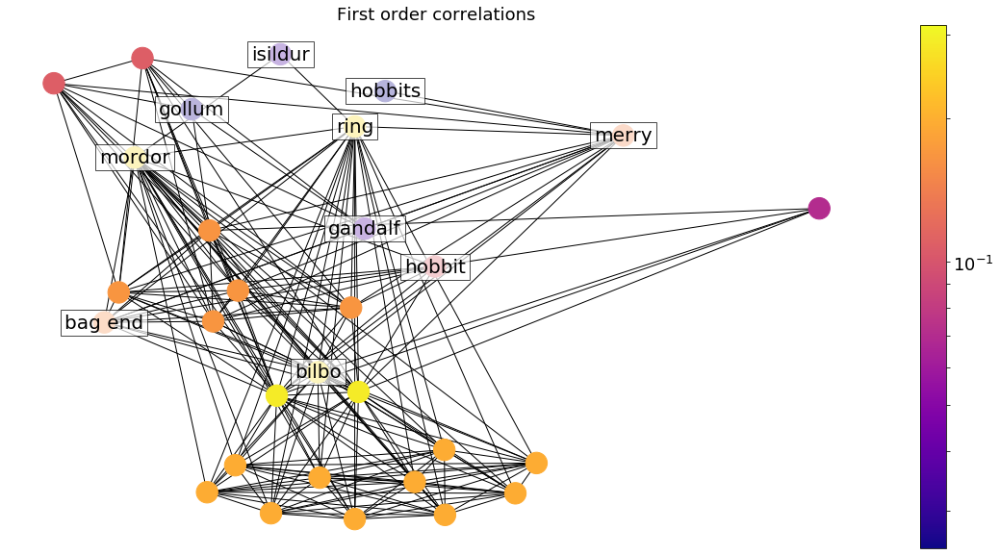

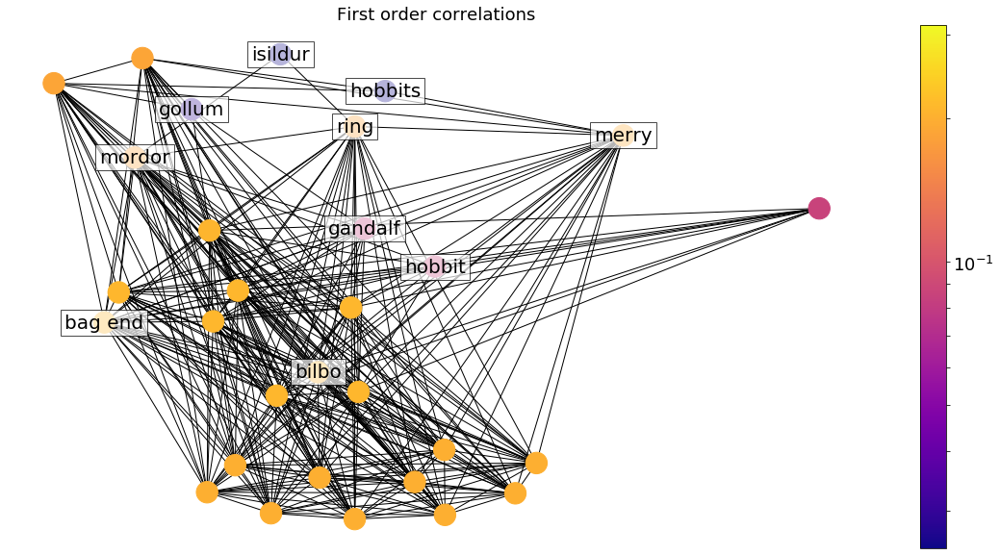

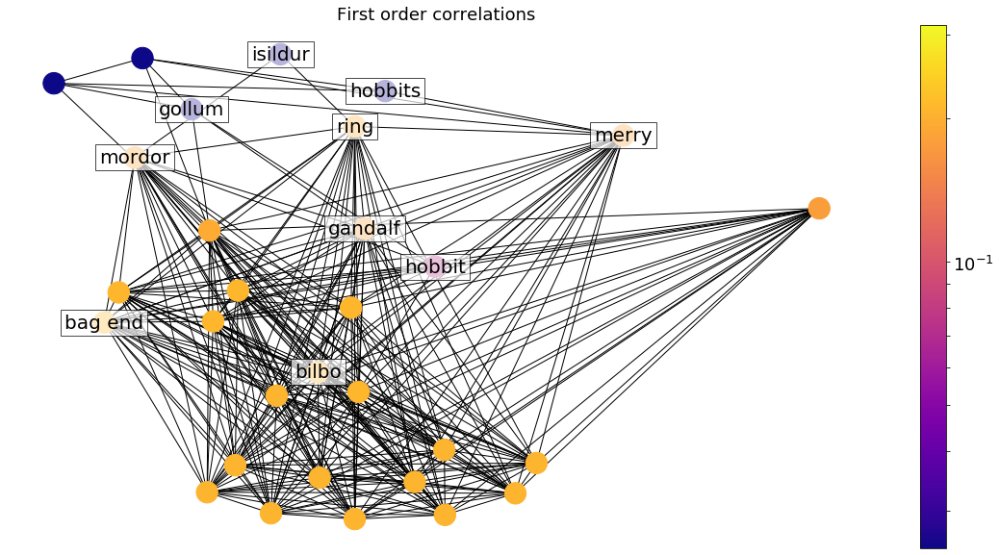

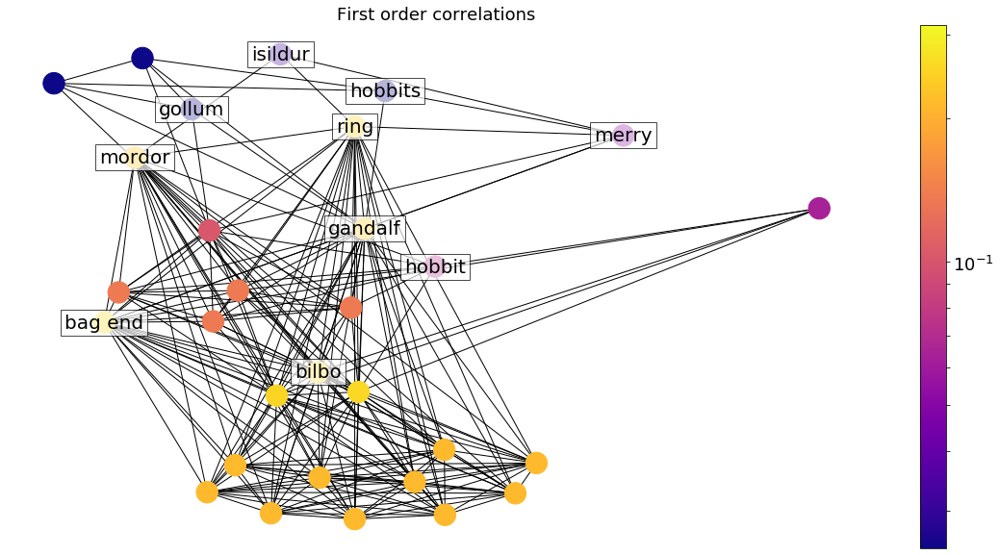

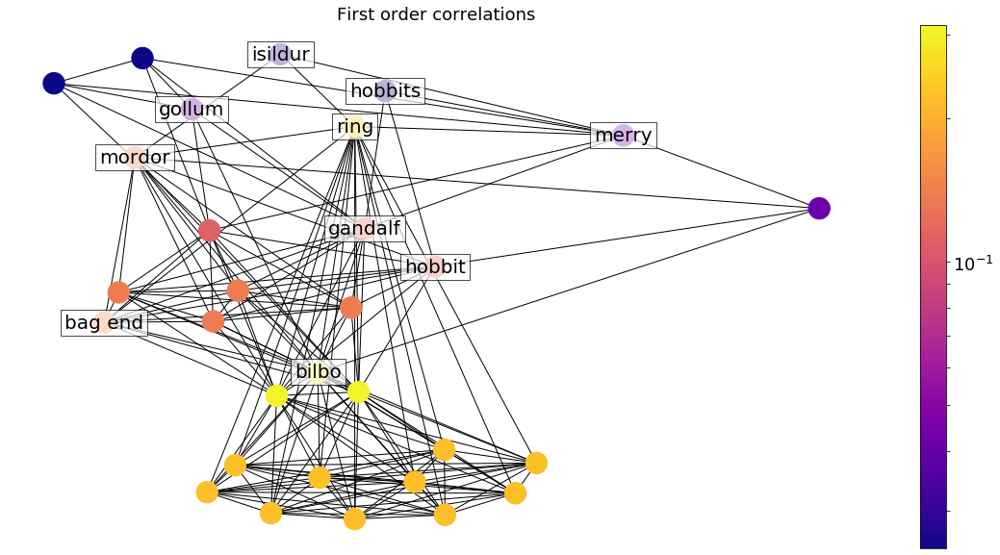

...

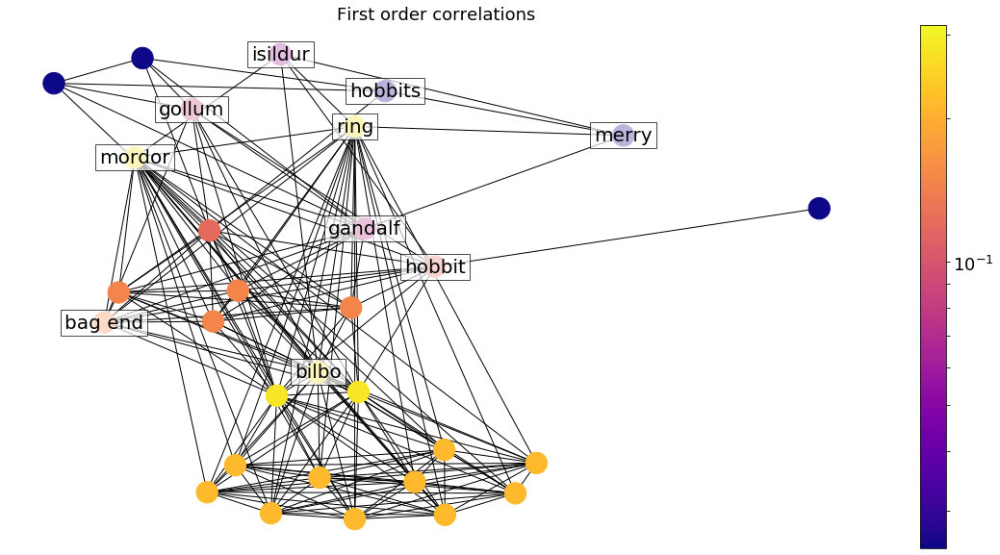

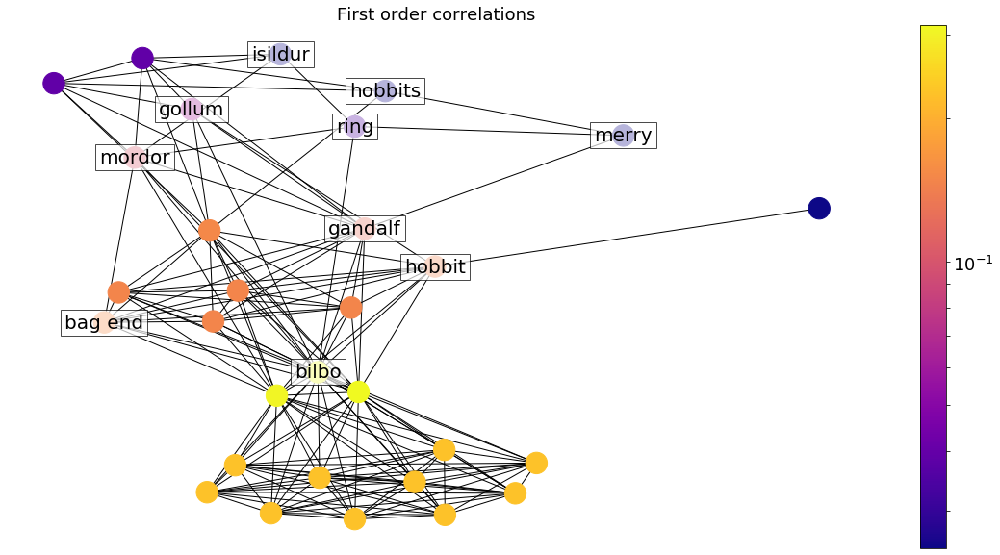

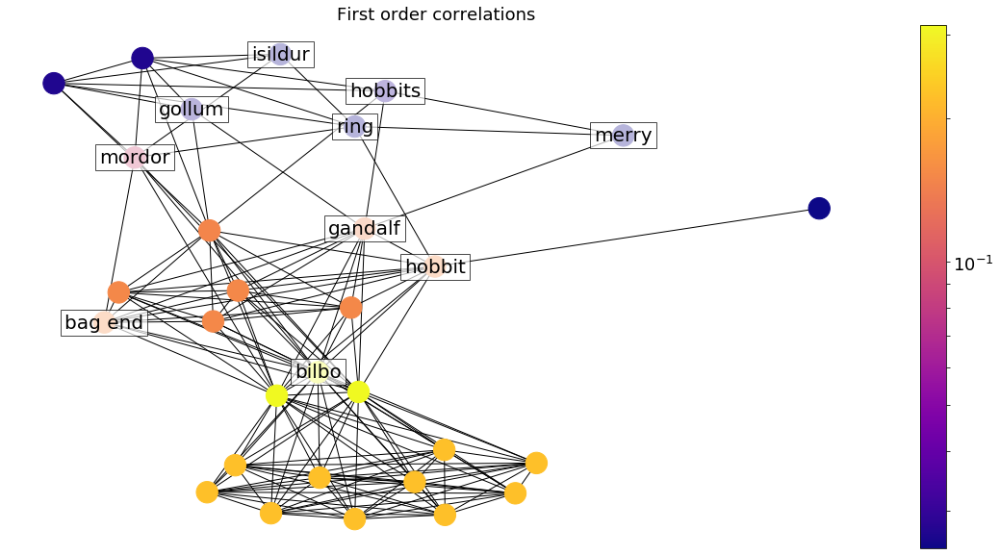

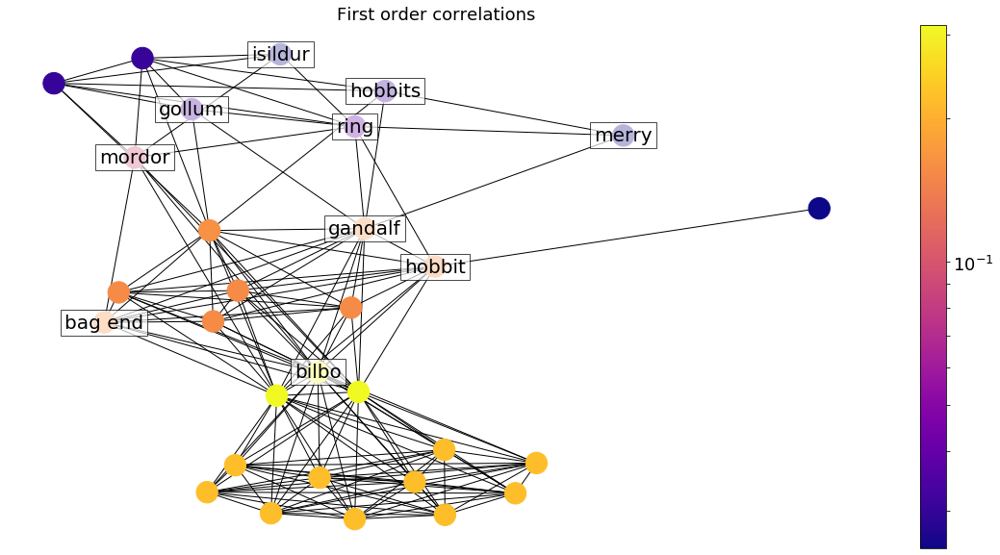

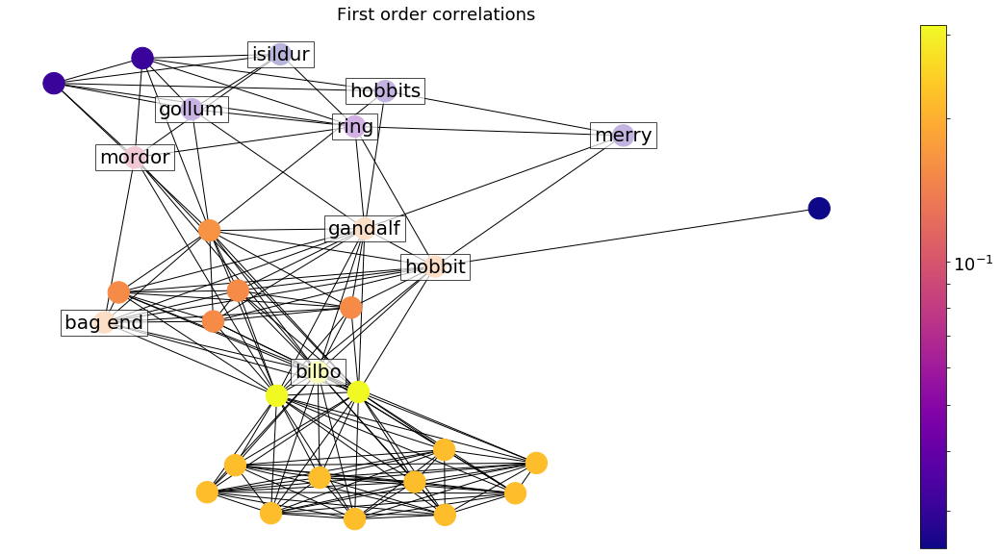

In [74]:
generate_network_plots(title_fn[1], fig_dir, 0.02)

We have 17 events and 191 characters
Original matrix has dimensions
vectorized shape : (17, 18336)
matrix shape : (191, 191, 17)
vectorized shape : (17, 1431)
matrix shape : (53, 53, 17)
We have 17 events and 191 characters
We have 17 events and 191 characters
Going to plot 32 characters as hubs out of 191
(17, 53)
vectorized shape : (17, 1431)
matrix shape : (53, 53, 17)


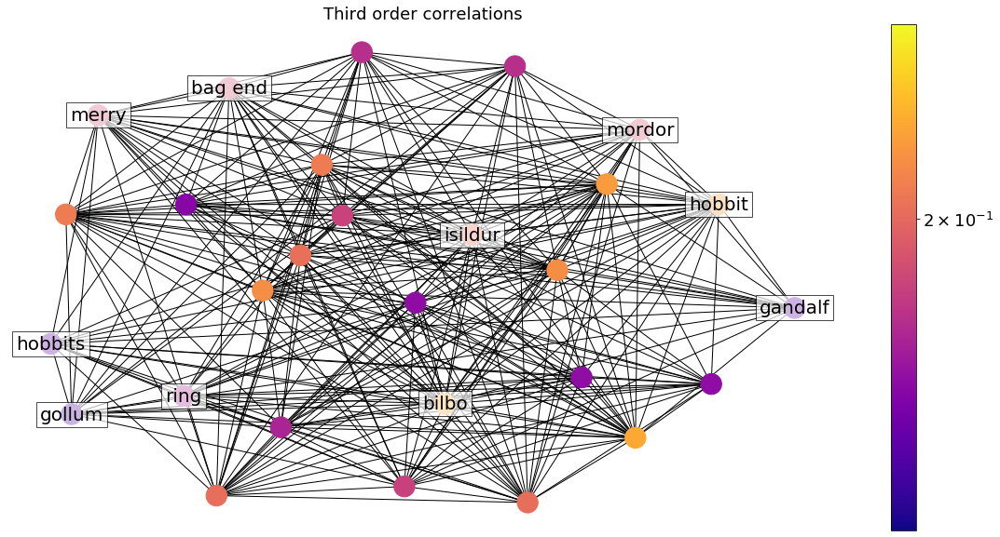

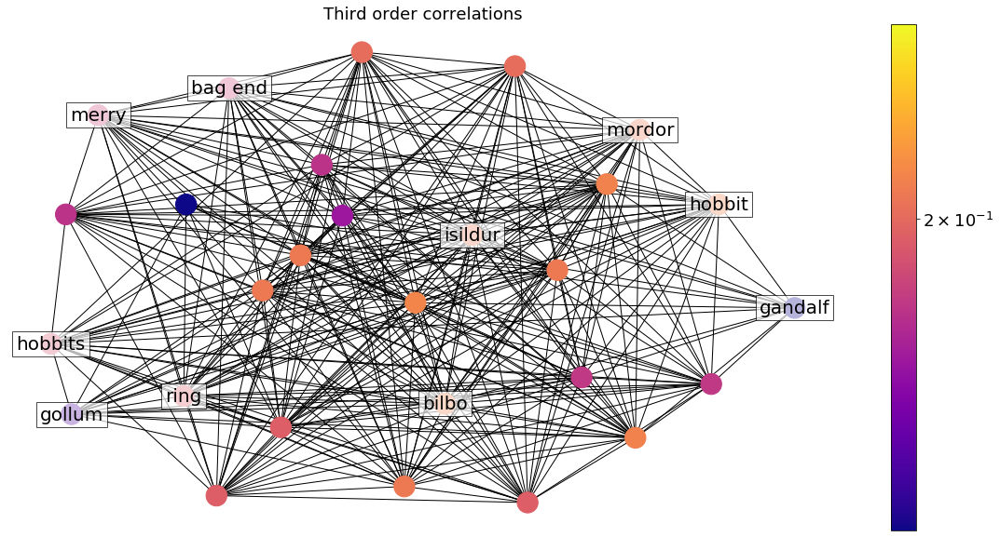

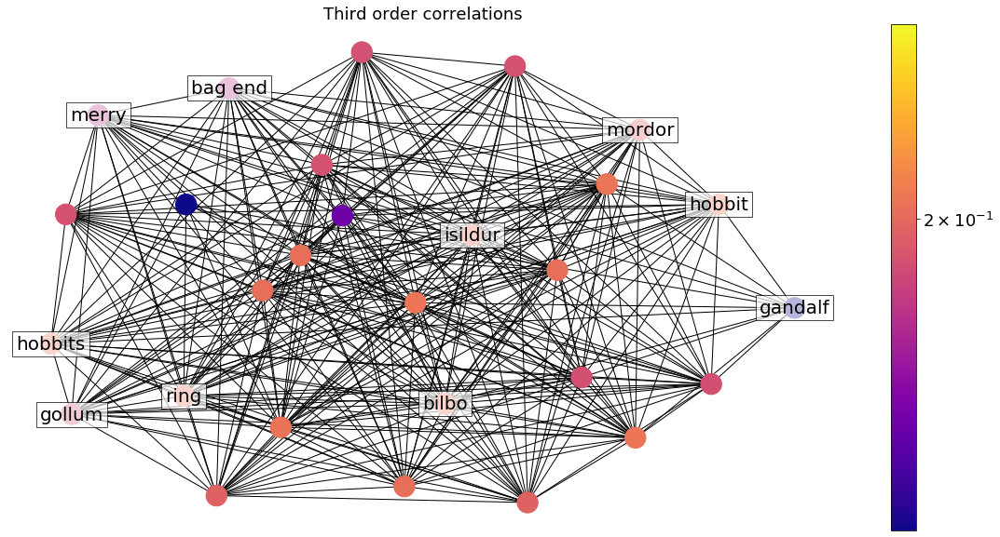

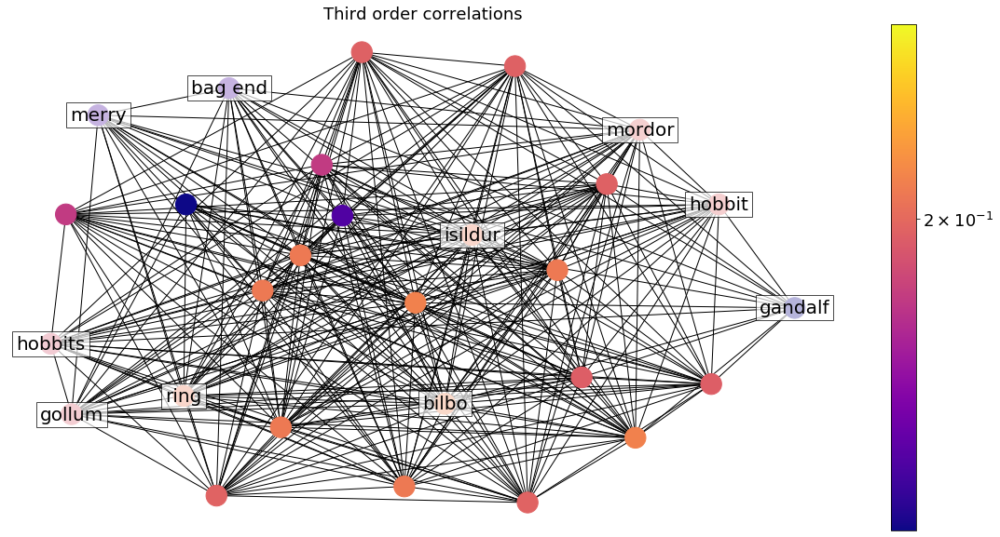

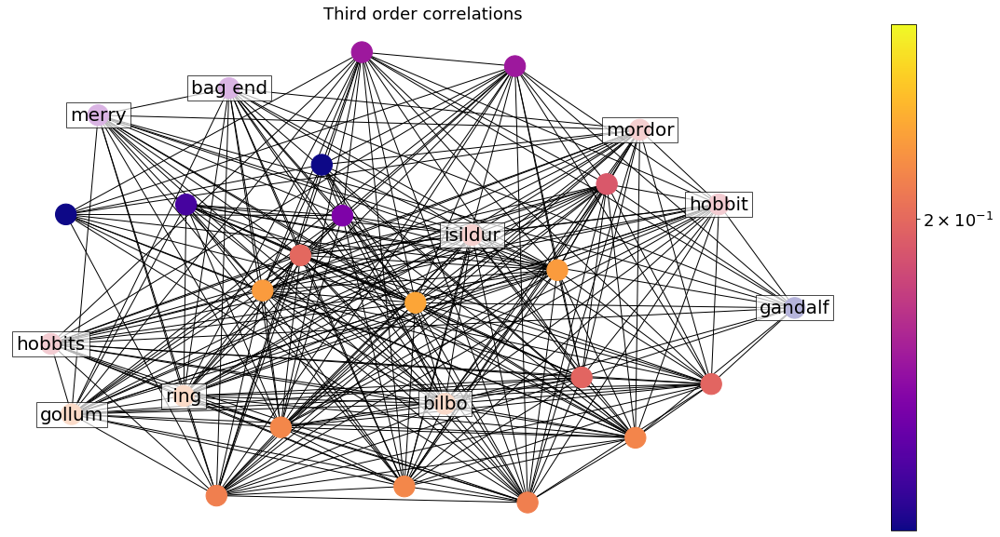

...

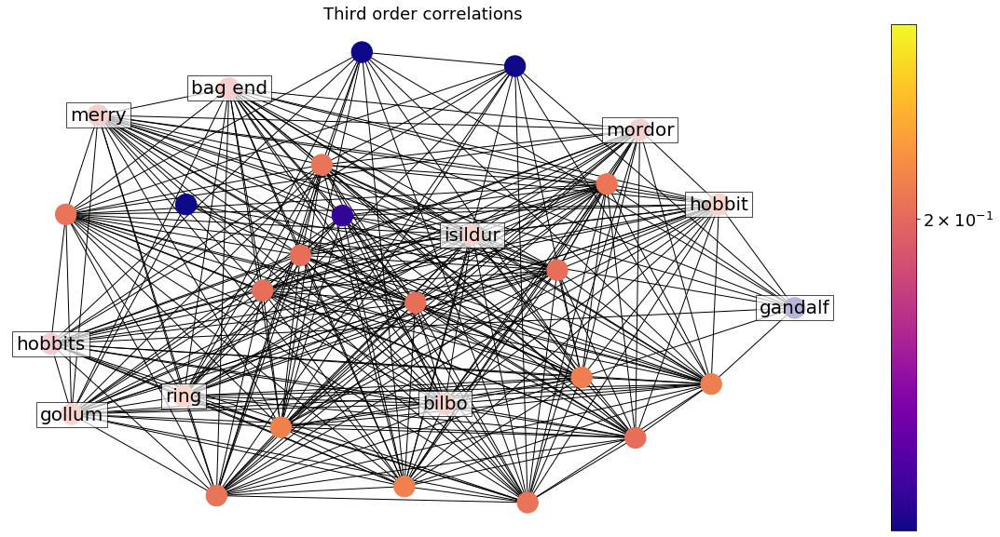

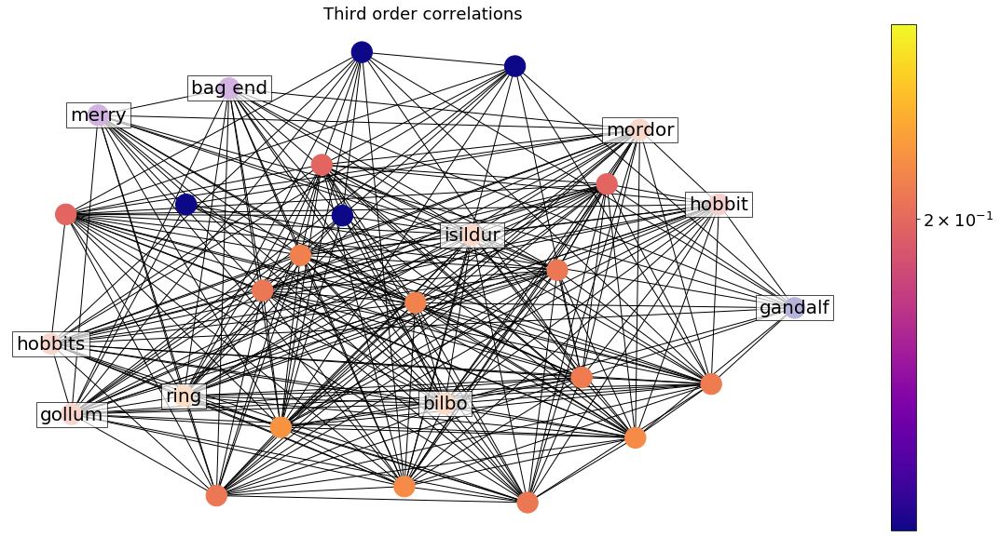

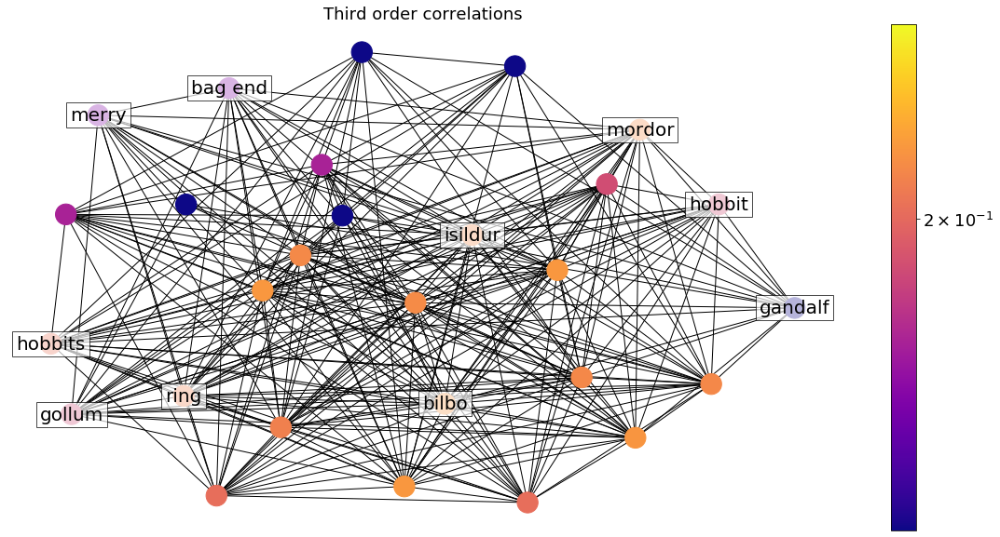

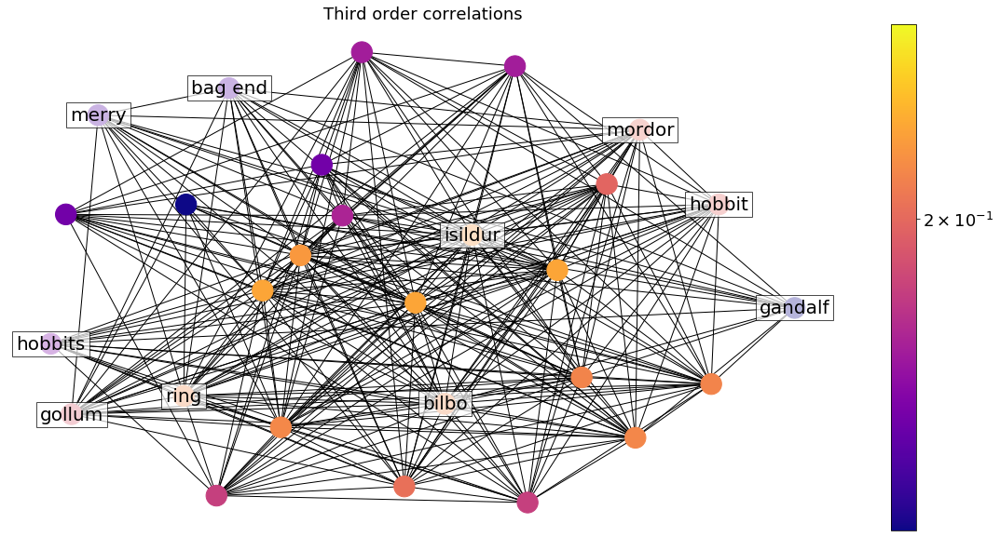

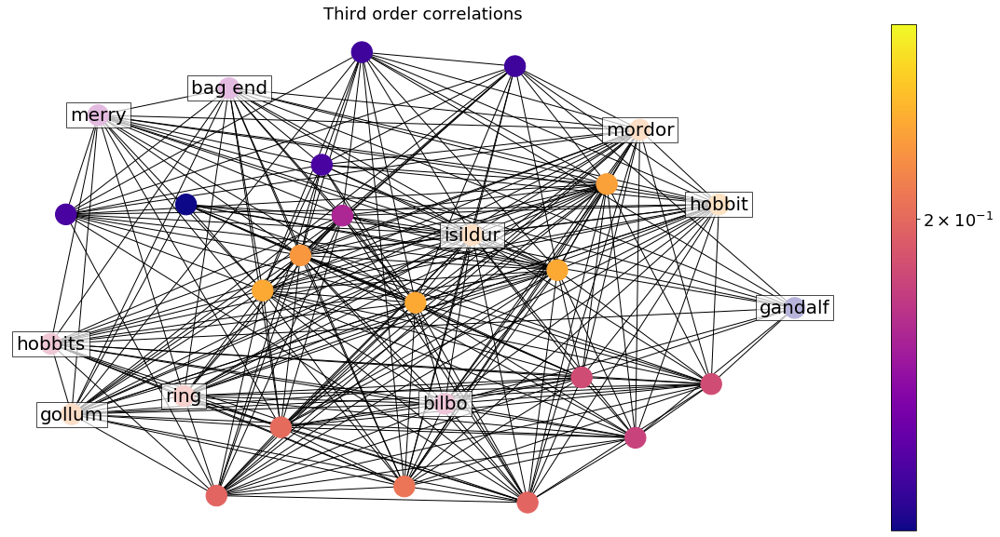

In [78]:
generate_network_plots_third_order(title_fn[1], fig_dir, 0.02)

We have 57 events and 117 characters
Original matrix has dimensions
vectorized shape : (57, 6903)
matrix shape : (117, 117, 57)
We have 57 events and 117 characters
Original matrix has dimensions
vectorized shape : (57, 6903)
matrix shape : (117, 117, 57)
We have 57 events and 117 characters
We have 57 events and 117 characters
Going to plot 16 characters as hubs out of 117


NetworkXError: Node 'william shakespeare' has no position.

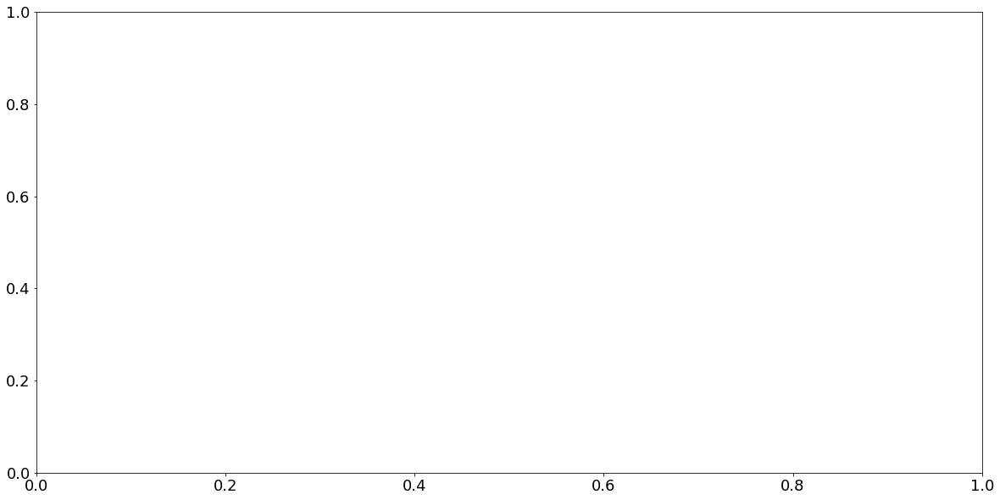

In [18]:
for fn in title_fn:
    generate_network_plots(fn, fig_dir, 0.05)

In [31]:
title_fn

['../../data/movie_data/10_things_i_hate_about_you.csv',
 '../../data/movie_data/lord_of_the_rings:_fellowship_of_the_ring,_the.csv',
 '../../data/movie_data/forrest_gump.csv',
 '../../data/movie_data/star_wars:_the_phantom_menace.csv']

In [ ]:
out_fn = '/Users/vassiki/Desktop/narrative_complexity/data/movie_data/bourne_identity,_the.csv'
out_df = pd.read_csv(out_fn)

In [ ]:
dyna_mat = get_dynamic_correlations_raw(out_df)
df = event_by_char_all_events(out_df)
char_names = df.columns

In [ ]:
main_chars = recurring_chars(out_df, 0.05)

In [ ]:
char_hubs = list(main_chars.columns)

In [ ]:
raw_dyna_mat = get_dynamic_correlations_raw(out_df)

In [ ]:
corrs_1 = dyna_mat
corrs_1_delta = raw_dyna_mat

In [ ]:
char_list = list(df.columns)

## Initialize the layout with the last event's eigenvector centrality layout 

In [ ]:
corr_1_vec = tc.mat2vec(corrs_1_delta)

In [ ]:
corr_1_r = np.asarray(tc.reduce(corr_1_vec, rfun='eigenvector_centrality'))

In [ ]:
width = 3
gaussian = {'name': 'Gaussian', 'weights': tc.gaussian_weights, 'params': {'var': width}}
corrs_2 = tc.vec2mat(tc.timecorr(corr_1_r, weights_function=gaussian['weights'], weights_params=gaussian['params']))

In [ ]:
gif_path = '../../figures/eig_corrs_1'

if not os.path.exists(gif_path):
    os.makedirs(gif_path)
    
plot_network_corrs(corrs_1[:80, :80, :], char_list[:80], char_hubs, 
                   filter_links=.2, gif_file=gif_path, title='First order correlations', network_measure='eigenvector_centrality')